# SOTA Descriptors in Action  

## Кулхацкинг 

In [ ]:
!pip uninstall opencv-contrib-python

In [ ]:
!pip install --user opencv-python==3.4.2.16
!pip install --user opencv-contrib-python==3.4.2.16

In [ ]:
%matplotlib inline
import cv2
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
import os
data_folder = os.path.join(os.curdir,'img')
data_set = [os.path.join(data_folder,file) for file in os.listdir(data_folder) if os.path.isfile(os.path.join(data_folder,file))]

In [3]:
def detect_match(algorithm,query_img,train_img,min_match_count,verbose=False):
    query_image = query_img
    train_image = train_img
    key_pts1,des1 = algorithm(query_image,None)
    key_pts2,des2 = algorithm(train_image,None)
    msed=np.inf
    if not (isinstance(des1,np.float32)&isinstance(des2,np.float32)):
        des1 = np.float32(des1)
        des2 = np.float32(des2)
    
    flann_idx = 1
    index_params = dict(algorithm = flann_idx, trees = 5)
    search_params = dict(checks = 50)

    flann = cv2.FlannBasedMatcher(index_params, search_params)

    matches = flann.knnMatch(des1,des2,k=2)

    # store all the good matches as per Lowe's ratio test.
    good = [m for m,n in matches if m.distance < 0.7*n.distance]
    
    if len(good)>min_match_count:
        src_pts = np.float32([ key_pts1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
        dst_pts = np.float32([ key_pts2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
        if M is None:
            return [0],[0],[0],[0],np.inf
        #print(M,mask)
        matchesMask = mask.ravel().tolist()
        h,w = query_image.shape
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
        dst = cv2.perspectiveTransform(pts,M)
        msed = np.mean([np.sqrt(np.sum(diff)) for diff in (np.power(pts-dst,2))]/(np.sqrt(h**2+w**2)))
        #cv2.polylines(train_image,[np.int32(dst)],True,255,3, cv2.LINE_AA)
    else:
        if verbose==True:
            print( "Not enough matches are found - {}/{}".format(len(good), min_match_count) )
        matchesMask = [0]
    
    return key_pts1, key_pts2, good, matchesMask, msed

def plot_match(query_img, train_img, key_pts1, key_pts2, good, matchesMask):
    draw_params = dict(matchColor = (255.0,255.0,255.0), # draw matches in white color
                   singlePointColor = (255.0,0,0),
                   matchesMask = matchesMask, # draw only inliers
                   flags = 2)
    img3 = cv2.drawMatches(query_img, key_pts1, train_img, key_pts2, good, None, **draw_params)
    plt.imshow(img3, 'gray'),plt.show()

In [4]:
alg_dict=dict(sift=cv2.xfeatures2d.SIFT_create().detectAndCompute,
              surf=cv2.xfeatures2d.SURF_create(200).detectAndCompute,
              akaze=cv2.AKAZE_create().detectAndCompute)
min_matches=10

## Поиграемся с изображениями зданий. 

In [5]:
images = [cv2.imread(image,0) for image in data_set]

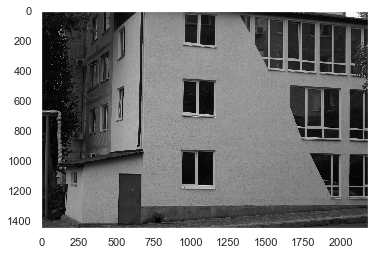

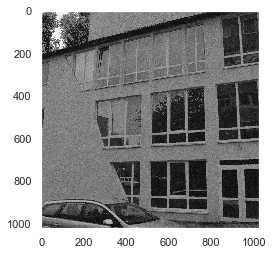

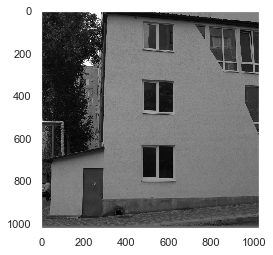

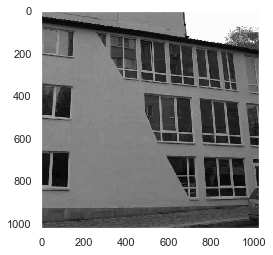

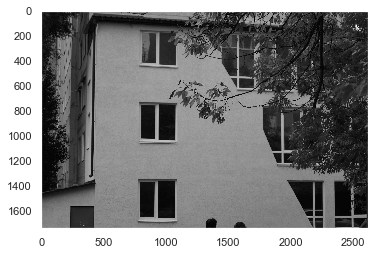

...

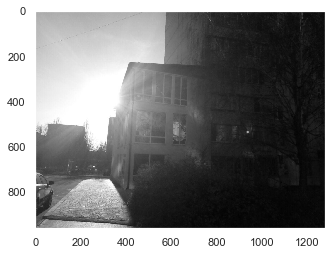

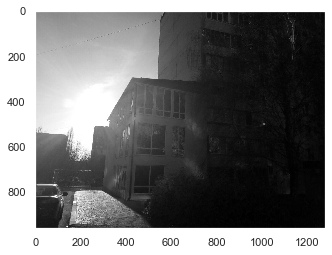

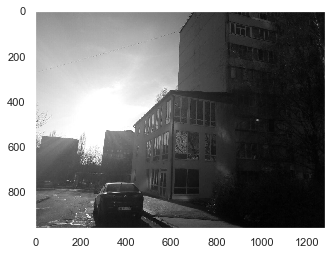

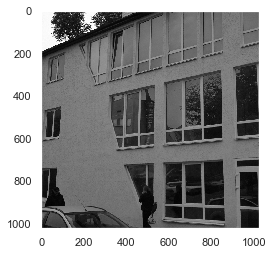

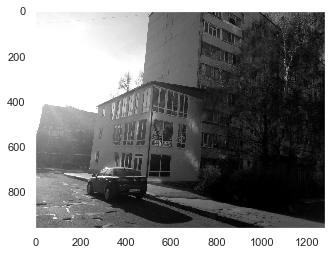

<Figure size 432x288 with 0 Axes>

In [6]:
sns.set()
with sns.axes_style({'axes.grid': False}):
    for idx, image in enumerate(images): 
        plt.imshow(images[idx], 'gray'),plt.show()
        plt.figure(idx+1)

In [7]:
key_pts1, key_pts2, good, matchesMask,msed = detect_match(algorithm=alg_dict['sift'],query_img=images[9],train_img=images[13],
                                                     min_match_count=10)

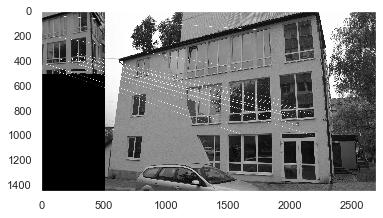

In [8]:
sns.set()
with sns.axes_style({'axes.grid': False}):
    img3=plot_match(query_img=images[9], key_pts1=key_pts1,train_img=images[13],  key_pts2=key_pts2, good=good, matchesMask=matchesMask)
    plt.show(img3)

In [9]:
import itertools
import time
inliers_matches = dict()
indexes = list(itertools.product(alg_dict.keys(),["inliers/matches","distance MSE","time (s)"]))
for im_j_idx in range(len(images)):
    inliers_matches["img"+str(im_j_idx)]=list()

In [10]:
for alg_name, alg in alg_dict.items():
    for im_i_idx, image_i in enumerate(images):
        time_start=time.monotonic()
        _, __, match, inlier ,msd = detect_match(algorithm=alg,query_img=image_i,train_img=images[13],
                                                     min_match_count=5)
        time_end=time.monotonic()
        if match==0:
            match=np.inf
        inliers_matches["img"+str(im_i_idx)].append(np.sum(inlier)/(len(match)))
        inliers_matches["img"+str(im_i_idx)].append(msd)
        inliers_matches["img"+str(im_i_idx)].append(time_end-time_start)

C:\Users\Dmitri Androsov\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in long_scalars
  if __name__ == '__main__':


In [11]:
import pandas as pd
index = pd.MultiIndex.from_tuples(indexes,names=['algorithm','property'])
comparison_df=pd.DataFrame(inliers_matches,index=index)

In [12]:
comparison_df

img0      img1      img2      img3      img4  \
algorithm property                                                             
sift      inliers/matches   0.128571  0.714674  0.233333  0.192308  0.160714   
          distance MSE      0.443625  0.385770  0.692922  0.398558  0.764854   
          time (s)          2.375000  1.843000  1.782000  1.859000  3.344000   
surf      inliers/matches   0.066667  0.737882  0.163265  0.119048  0.067961   
          distance MSE      0.571508  0.386039  1.481814  0.448302  0.409828   
          time (s)         21.547000  3.234000  2.922000  3.110000  4.859000   
akaze     inliers/matches   0.200000  0.845912  0.714286  0.411765  0.444444   
          distance MSE      0.273862  0.385388  1.351218  0.385899  0.326259   
          time (s)          2.156000  1.125000  1.125000  1.141000  2.125000   

                               img5      img6      img7      img8      img9  \
algorithm property                                                            
sift      inliers/matches  0.000000  0.416667  0.740310  0.500000  0.527778   
          distance MSE          inf  1.148170  0.140032  2.126189  1.727094   
          time (s)         1.734000  1.656000  1.828000  1.438000  1.422000   
surf      inliers/matches  0.666667  0.153846  0.645485  0.363636  0.500000   
          distance MSE     0.980497  2.780886  0.139908  0.804734  1.725042   
          time (s)         2.656000  2.766000  3.094000  2.421000  2.454000   
akaze     inliers/matches  0.000000  0.000000  0.741071       NaN  0.750000   
          distance MSE          inf       inf  0.140259       inf  1.713080   
          time (s)         1.156000  1.094000  1.203000  0.890000  0.985000   

                           ...     img80     img81     img82     img83  \
algorithm property         ...                                           
sift      inliers/matches  ...  0.227273  0.166667  0.176471  0.222222   
          distance MSE     ...  2.111907  0.585971  0.783252  0.766220   
          time (s)         ...  2.063000  2.141000  2.031000  1.984000   
surf      inliers/matches  ...  0.290323  0.333333  0.309859  0.160000   
          distance MSE     ...  0.925377  0.925206  0.904374  2.334165   
          time (s)         ...  3.171000  3.344000  3.281000  3.313000   
akaze     inliers/matches  ...  0.000000  0.666667  0.500000  0.000000   
          distance MSE     ...       inf  4.637023  0.929325       inf   
          time (s)         ...  1.313000  1.437000  1.453000  1.282000   

                              img84  img85  img86     img87     img88  \
algorithm property                                                      
sift      inliers/matches  0.250000  0.000  0.000  0.000000  0.388535   
          distance MSE     1.354881    inf    inf       inf  0.312005   
          time (s)         2.813000  1.859  1.844  2.187000  2.328000   
surf      inliers/matches  0.146341  0.000  0.000  0.363636  0.378289   
          distance MSE     1.086827    inf    inf  3.587140  0.312975   
          time (s)         4.094000  2.703  2.609  2.703000  3.016000   
akaze     inliers/matches  0.000000    NaN    NaN       NaN  0.490196   
          distance MSE          inf    inf    inf       inf  0.313675   
          time (s)         1.218000  1.125  1.094  1.156000  1.172000   

                              img89  
algorithm property                   
sift      inliers/matches  0.212121  
          distance MSE     0.869943  
          time (s)         2.266000  
surf      inliers/matches  0.200000  
          distance MSE     0.954774  
          time (s)         3.094000  
akaze     inliers/matches  0.000000  
          distance MSE          inf  
          time (s)         1.157000  

[9 rows x 90 columns]

In [13]:
best_inliers = {descr:{int(k[3:]):np.round(v,2) for k,v in zip(
                comparison_df.drop(columns=['img13']).loc[descr].sort_values(by=['inliers/matches'],axis=1,
                                    ascending=False).loc['inliers/matches'].index.values,
                 comparison_df.drop(columns=['img13']).loc[descr].sort_values(by=['inliers/matches'],axis=1,
                                     ascending=False).loc['inliers/matches'].values) if v>=0.3} for descr in alg_dict.keys()}

best_inliers

{'sift': {26: 0.8,
  7: 0.74,
  1: 0.71,
  29: 0.67,
  25: 0.57,
  30: 0.57,
  45: 0.55,
  9: 0.53,
  10: 0.5,
  38: 0.5,
  8: 0.5,
  66: 0.49,
  50: 0.45,
  6: 0.42,
  34: 0.39,
  24: 0.39,
  88: 0.39,
  51: 0.38,
  55: 0.38,
  11: 0.37,
  52: 0.37,
  53: 0.37,
  72: 0.36,
  15: 0.35,
  60: 0.35,
  18: 0.35,
  54: 0.34,
  31: 0.34,
  14: 0.33,
  74: 0.33,
  75: 0.32,
  59: 0.32},
 'surf': {26: 0.85,
  1: 0.74,
  5: 0.67,
  7: 0.65,
  40: 0.62,
  38: 0.57,
  37: 0.57,
  39: 0.56,
  50: 0.5,
  9: 0.5,
  45: 0.42,
  66: 0.38,
  88: 0.38,
  87: 0.36,
  8: 0.36,
  31: 0.34,
  24: 0.33,
  81: 0.33,
  77: 0.33,
  79: 0.32,
  51: 0.31,
  82: 0.31,
  30: 0.3},
 'akaze': {26: 0.94,
  1: 0.85,
  66: 0.75,
  9: 0.75,
  7: 0.74,
  2: 0.71,
  53: 0.71,
  50: 0.71,
  21: 0.67,
  78: 0.67,
  81: 0.67,
  60: 0.64,
  74: 0.6,
  72: 0.59,
  57: 0.59,
  32: 0.57,
  31: 0.55,
  44: 0.53,
  82: 0.5,
  88: 0.49,
  73: 0.49,
  77: 0.48,
  59: 0.48,
  54: 0.46,
  35: 0.45,
  4: 0.44,
  71: 0.42,
  3: 0.41,
  

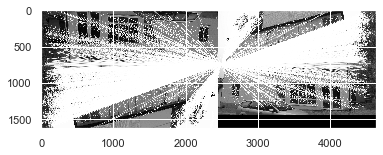

In [14]:
key_pts1, key_pts2, good, matchesMask, _ = detect_match(algorithm=alg_dict['sift'],query_img=images[26],train_img=images[13],
                                                     min_match_count=10)
img3=plot_match(query_img=images[26], key_pts1=key_pts1,train_img=images[13],  key_pts2=key_pts2, good=good, matchesMask=matchesMask)
plt.show(img3)


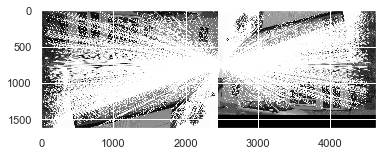

In [15]:
key_pts1, key_pts2, good, matchesMask, _ = detect_match(algorithm=alg_dict['surf'],query_img=images[26],train_img=images[13],
                                                     min_match_count=10)
img3=plot_match(query_img=images[26], key_pts1=key_pts1,train_img=images[13],  key_pts2=key_pts2, good=good, matchesMask=matchesMask)
plt.show(img3)

    

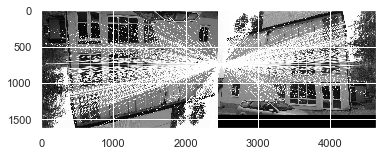

In [16]:
key_pts1, key_pts2, good, matchesMask, _ = detect_match(algorithm=alg_dict['akaze'],query_img=images[26],train_img=images[13],
                                                     min_match_count=10)
img3=plot_match(query_img=images[26], key_pts1=key_pts1,train_img=images[13],  key_pts2=key_pts2, good=good, matchesMask=matchesMask)
plt.show(img3)


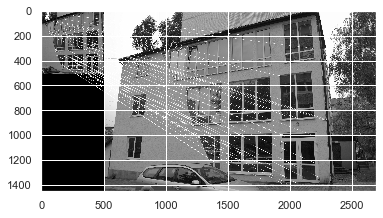

In [17]:
key_pts1, key_pts2, good, matchesMask, _ = detect_match(algorithm=alg_dict['sift'],query_img=images[66],train_img=images[13],
                                                     min_match_count=10)
img3=plot_match(query_img=images[66], key_pts1=key_pts1,train_img=images[13],  key_pts2=key_pts2, good=good, matchesMask=matchesMask)
plt.show(img3)

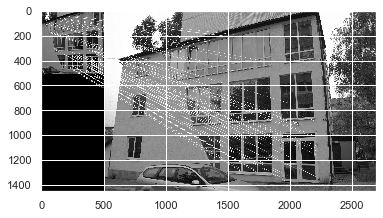

In [18]:
key_pts1, key_pts2, good, matchesMask, _ = detect_match(algorithm=alg_dict['surf'],query_img=images[66],train_img=images[13],
                                                     min_match_count=10)
img3=plot_match(query_img=images[66], key_pts1=key_pts1,train_img=images[13],  key_pts2=key_pts2, good=good, matchesMask=matchesMask)
plt.show(img3)

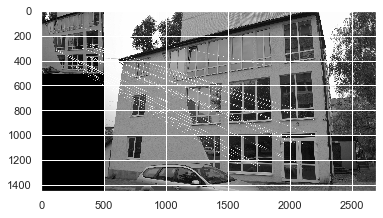

In [19]:
key_pts1, key_pts2, good, matchesMask, _ = detect_match(algorithm=alg_dict['akaze'],query_img=images[66],train_img=images[13],
                                                     min_match_count=10)
img3=plot_match(query_img=images[66], key_pts1=key_pts1,train_img=images[13],  key_pts2=key_pts2, good=good, matchesMask=matchesMask)
plt.show(img3)

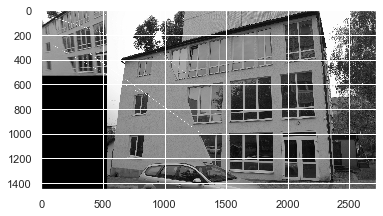

In [20]:
key_pts1, key_pts2, good, matchesMask, _ = detect_match(algorithm=alg_dict['sift'],query_img=images[48],train_img=images[13],
                                                     min_match_count=10)
img3=plot_match(query_img=images[48], key_pts1=key_pts1,train_img=images[13],  key_pts2=key_pts2, good=good, matchesMask=matchesMask)
plt.show(img3)

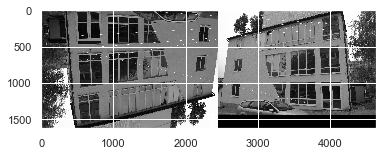

In [21]:
key_pts1, key_pts2, good, matchesMask, _ = detect_match(algorithm=alg_dict['surf'],query_img=images[24],train_img=images[13],
                                                     min_match_count=10)
img3=plot_match(query_img=images[26], key_pts1=key_pts1,train_img=images[13],  key_pts2=key_pts2, good=good, matchesMask=matchesMask)
plt.show(img3)

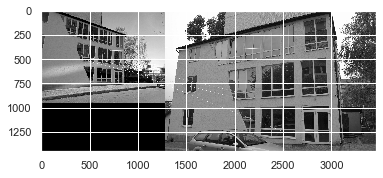

In [22]:
key_pts1, key_pts2, good, matchesMask, _ = detect_match(algorithm=alg_dict['akaze'],query_img=images[63],train_img=images[13],
                                                     min_match_count=10)
img3=plot_match(query_img=images[63], key_pts1=key_pts1,train_img=images[13],  key_pts2=key_pts2, good=good, matchesMask=matchesMask)
plt.show(img3)

### Вывод 
#### Как видим, все три дескриптора одинаково хорошо справилость с поворотами изображения на 90 градусов, при небольших манипуляций с углом поворота собственно камеры перед исследуемым объектом.
#### SIFT наихудше справляется при некоторой зашумленности тестируемой фотографии и малого искажения перспективы. SURF - при повороте изображения на 90 градусов + небольшого изменения угла камеры, а AKAZE - при большой перспективе и разницей углов камеры больше 90 градусов .


### Ну тут как бы и так всё ясно уже, но проверим дескрипторы на втором датасэте с чашками 

In [23]:
sec_data_folder = os.path.join(os.curdir,'img2')
sec_data_set = [os.path.join(sec_data_folder,file) for file in os.listdir(sec_data_folder) if os.path.isfile(os.path.join(sec_data_folder,file))]

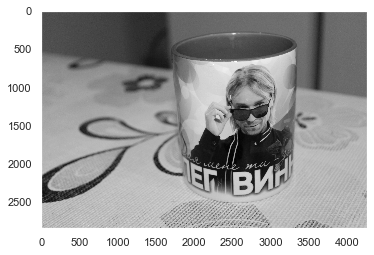

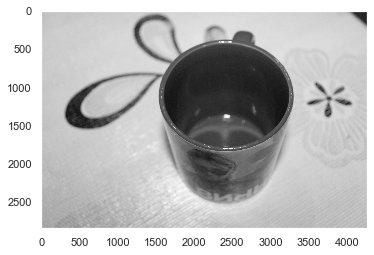

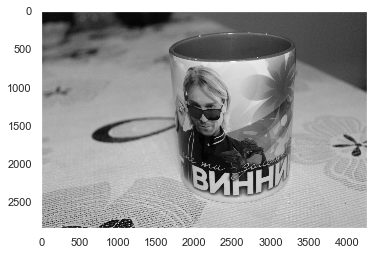

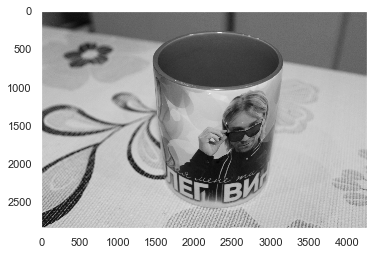

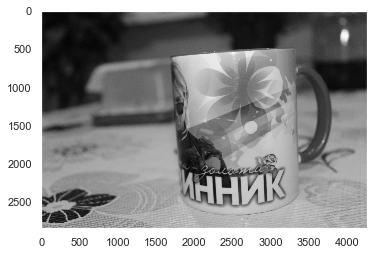

...

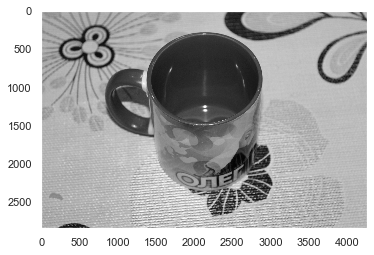

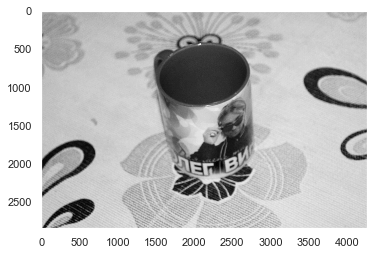

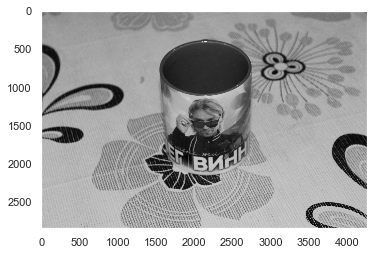

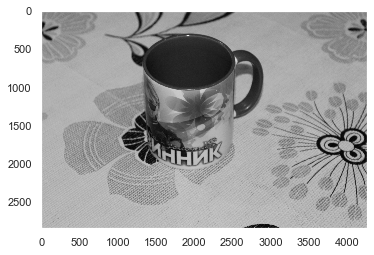

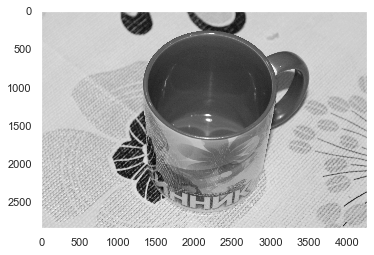

<Figure size 432x288 with 0 Axes>

In [24]:
sec_images = [cv2.imread(image,0) for image in sec_data_set]
sns.set()
with sns.axes_style({'axes.grid': False}):
    for idx, image in enumerate(sec_images): 
        plt.imshow(sec_images[idx], 'gray'),plt.show()
        plt.figure(idx+1)

In [25]:
sec_inliers_matches = dict()

for im_j_idx in range(len(sec_images)):
    sec_inliers_matches["img"+str(im_j_idx)]=list()

for alg_name, alg in alg_dict.items():
    for im_i_idx, image_i in enumerate(sec_images):
        time_start=time.monotonic()
        _, __, match, inlier ,msd = detect_match(algorithm=alg,query_img=image_i,train_img=sec_images[0],
                                                     min_match_count=5)
        time_end=time.monotonic()
        if match==0:
            match=np.inf
        sec_inliers_matches["img"+str(im_i_idx)].append(np.sum(inlier)/(len(match)))
        sec_inliers_matches["img"+str(im_i_idx)].append(msd)
        sec_inliers_matches["img"+str(im_i_idx)].append(time_end-time_start)


In [26]:
sec_comparison_df=pd.DataFrame(sec_inliers_matches,index=index)
sec_comparison_df

img0      img1       img2      img3  \
algorithm property                                                       
sift      inliers/matches  1.000000e+00  0.666667   0.366667  0.263636   
          distance MSE     3.992779e-15  0.907670   2.776143  0.237898   
          time (s)         1.256410e+02  7.500000   7.562000  7.594000   
surf      inliers/matches  1.000000e+00  0.428571   0.173228  0.305556   
          distance MSE     7.141356e-16  0.981682   0.874456  0.160276   
          time (s)         7.250000e+00  6.172000  11.219000  6.922000   
akaze     inliers/matches  1.000000e+00  0.000000   0.428571  0.468750   
          distance MSE     5.688339e-16       inf   0.362601  0.187866   
          time (s)         6.094000e+00  5.312000   5.500000  5.422000   

                               img4      img5      img6      img7      img8  \
algorithm property                                                            
sift      inliers/matches  0.444444  0.466667  0.241379  0.307692  0.285714   
          distance MSE     1.323066  0.639536  0.496686  0.547536  0.605405   
          time (s)         7.156000  7.313000  7.312000  7.282000  7.187000   
surf      inliers/matches  0.137931  0.107692  0.125000  0.135135  0.148148   
          distance MSE     0.848392  0.517267  0.512560  0.401978  0.669517   
          time (s)         6.437000  6.485000  6.687000  6.578000  6.422000   
akaze     inliers/matches  0.416667  0.625000  0.333333  0.444444  0.571429   
          distance MSE     3.262967  0.645076  0.545450  0.549030  0.518976   
          time (s)         5.344000  5.343000  5.438000  5.375000  5.359000   

                               img9  ...     img69     img70     img71  \
algorithm property                   ...                                 
sift      inliers/matches  0.333333  ...  0.333333  0.175000  0.234043   
          distance MSE     0.516688  ...  0.516028  0.584908  0.169369   
          time (s)         7.563000  ...  7.750000  7.656000  8.594000   
surf      inliers/matches  0.142857  ...  0.145161  0.077519  0.205333   
          distance MSE     0.501429  ...  0.519334  0.519151  0.180248   
          time (s)         6.453000  ...  6.235000  7.156000  8.094000   
akaze     inliers/matches  0.666667  ...  0.555556  0.294118  0.253846   
          distance MSE     0.502102  ...  0.525152  5.118328  0.184926   
          time (s)         5.391000  ...  5.360000  5.328000  5.859000   

                              img72     img73     img74     img75     img76  \
algorithm property                                                            
sift      inliers/matches  0.400000  0.263158  0.291667  0.357143  0.217742   
          distance MSE     0.552391  0.579297  0.451864  1.946133  0.591995   
          time (s)         7.813000  7.640000  7.719000  7.328000  8.219000   
surf      inliers/matches  0.210526  0.096774  0.230769  0.269231  0.170213   
          distance MSE     4.115836  0.507752  0.513987  0.506741  0.750742   
          time (s)         6.609000  7.844000  7.297000  6.281000  7.672000   
akaze     inliers/matches  0.000000  0.285714  0.357143  0.333333  0.177215   
          distance MSE          inf  0.514705  0.578433  0.520318  0.411764   
          time (s)         5.328000  5.641000  5.750000  5.391000  5.765000   

                              img77     img78  
algorithm property                             
sift      inliers/matches  0.285714  0.315789  
          distance MSE     1.187634  0.612278  
          time (s)         7.469000  8.921000  
surf      inliers/matches  0.089109  0.107692  
          distance MSE     0.528195  0.688871  
          time (s)         7.469000  7.281000  
akaze     inliers/matches  0.400000  0.500000  
          distance MSE     0.590611  0.475238  
          time (s)         5.485000  5.500000  

[9 rows x 79 columns]

In [27]:
best_inliers = {descr:{int(k[3:]):np.round(v,2) for k,v in zip(
                sec_comparison_df.drop(columns=['img0']).loc[descr].sort_values(by=['inliers/matches'],axis=1,
                                    ascending=False).loc['inliers/matches'].index.values,
                 sec_comparison_df.drop(columns=['img0']).loc[descr].sort_values(by=['inliers/matches'],axis=1,
                                     ascending=False).loc['inliers/matches'].values) if v>=0.1} for descr in alg_dict.keys()}

best_inliers

{'sift': {41: 0.73,
  36: 0.71,
  1: 0.67,
  56: 0.62,
  17: 0.57,
  38: 0.57,
  25: 0.57,
  19: 0.53,
  5: 0.47,
  68: 0.46,
  53: 0.45,
  4: 0.44,
  58: 0.42,
  65: 0.4,
  72: 0.4,
  10: 0.4,
  20: 0.38,
  64: 0.38,
  12: 0.38,
  67: 0.37,
  2: 0.37,
  45: 0.36,
  75: 0.36,
  16: 0.35,
  52: 0.35,
  14: 0.35,
  42: 0.34,
  60: 0.33,
  43: 0.33,
  18: 0.33,
  37: 0.33,
  9: 0.33,
  24: 0.33,
  69: 0.33,
  11: 0.32,
  29: 0.32,
  78: 0.32,
  7: 0.31,
  15: 0.31,
  27: 0.3,
  23: 0.3,
  34: 0.3,
  48: 0.29,
  74: 0.29,
  32: 0.29,
  46: 0.29,
  77: 0.29,
  8: 0.29,
  49: 0.29,
  26: 0.28,
  3: 0.26,
  22: 0.26,
  73: 0.26,
  39: 0.26,
  33: 0.25,
  6: 0.24,
  54: 0.24,
  50: 0.24,
  59: 0.24,
  71: 0.23,
  57: 0.23,
  63: 0.23,
  51: 0.23,
  76: 0.22,
  61: 0.21,
  66: 0.21,
  13: 0.2,
  62: 0.19,
  55: 0.19,
  35: 0.18,
  70: 0.18,
  21: 0.17,
  28: 0.15,
  31: 0.15},
 'surf': {37: 0.57,
  25: 0.5,
  41: 0.5,
  1: 0.43,
  47: 0.43,
  44: 0.4,
  53: 0.34,
  67: 0.33,
  60: 0.32,
  43: 0

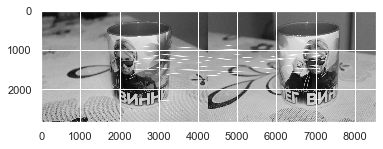

In [28]:
key_pts1, key_pts2, good, matchesMask, _ = detect_match(algorithm=alg_dict['sift'],query_img=sec_images[2],train_img=sec_images[0],
                                                     min_match_count=5)
img3=plot_match(query_img=sec_images[2], key_pts1=key_pts1,train_img=sec_images[0],  key_pts2=key_pts2, good=good, matchesMask=matchesMask)
plt.show(img3)

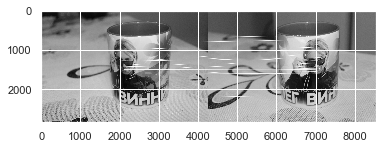

In [29]:
key_pts1, key_pts2, good, matchesMask, _ = detect_match(algorithm=alg_dict['surf'],query_img=sec_images[2],train_img=sec_images[0],
                                                     min_match_count=5)
img3=plot_match(query_img=sec_images[2], key_pts1=key_pts1,train_img=sec_images[0],  key_pts2=key_pts2, good=good, matchesMask=matchesMask)
plt.show(img3)

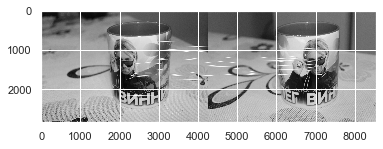

In [30]:
key_pts1, key_pts2, good, matchesMask, _ = detect_match(algorithm=alg_dict['akaze'],query_img=sec_images[2],train_img=sec_images[0],
                                                     min_match_count=5)
img3=plot_match(query_img=sec_images[2], key_pts1=key_pts1,train_img=sec_images[0],  key_pts2=key_pts2, good=good, matchesMask=matchesMask)
plt.show(img3)

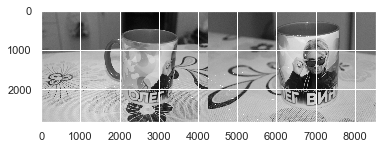

In [31]:
key_pts1, key_pts2, good, matchesMask, _ = detect_match(algorithm=alg_dict['sift'],query_img=sec_images[31],train_img=sec_images[0],
                                                     min_match_count=5)
img3=plot_match(query_img=sec_images[31], key_pts1=key_pts1,train_img=sec_images[0],  key_pts2=key_pts2, good=good, matchesMask=matchesMask)
plt.show(img3)

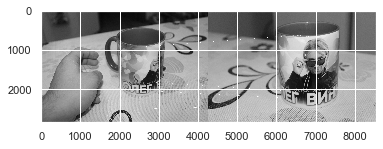

In [32]:
key_pts1, key_pts2, good, matchesMask, _ = detect_match(algorithm=alg_dict['surf'],query_img=sec_images[66],train_img=sec_images[0],
                                                     min_match_count=5)
img3=plot_match(query_img=sec_images[66], key_pts1=key_pts1,train_img=sec_images[0],  key_pts2=key_pts2, good=good, matchesMask=matchesMask)
plt.show(img3)

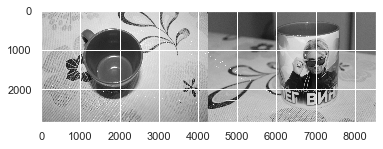

In [33]:
key_pts1, key_pts2, good, matchesMask, _ = detect_match(algorithm=alg_dict['akaze'],query_img=sec_images[55],train_img=sec_images[0],
                                                     min_match_count=5)
img3=plot_match(query_img=sec_images[55], key_pts1=key_pts1,train_img=sec_images[0],  key_pts2=key_pts2, good=good, matchesMask=matchesMask)
plt.show(img3)

### Вывод
#### Видно, что дескрипторы вполне хорошо справляются с небольшими поворотами (не на тупой азимутальный угол) камеры относительно предмета, однако плохо работают, если добавить экстремальные повороты зенитного угла.

### Сэт третий (cringe)

In [38]:
third_data_folder = os.path.join(os.curdir,'img3')
third_data_set = [os.path.join(third_data_folder,file) for file in os.listdir(third_data_folder) if os.path.isfile(os.path.join(third_data_folder,file))]

third_images = [cv2.imread(image,0) for image in third_data_set]

In [40]:
third_inliers_matches = dict()

for im_j_idx in range(len(third_images)):
    third_inliers_matches["img"+str(im_j_idx)]=list()

for alg_name, alg in alg_dict.items():
    for im_i_idx, image_i in enumerate(third_images):
        time_start=time.monotonic()
        _, __, match, inlier ,msd = detect_match(algorithm=alg,query_img=image_i,train_img=third_images[0],
                                                     min_match_count=5)
        time_end=time.monotonic()
        if match==0:
            match=np.inf
        third_inliers_matches["img"+str(im_i_idx)].append(np.sum(inlier)/(len(match)))
        third_inliers_matches["img"+str(im_i_idx)].append(msd)
        third_inliers_matches["img"+str(im_i_idx)].append(time_end-time_start)
        
third_comparison_df=pd.DataFrame(third_inliers_matches,index=index)
third_comparison_df 

img0      img1      img2      img3  \
algorithm property                                                      
sift      inliers/matches  1.000000e+00  0.000000  0.328000  0.293333   
          distance MSE     3.992779e-15       inf  2.881445  0.117601   
          time (s)         7.906000e+00  7.375000  8.937000  7.516000   
surf      inliers/matches  1.000000e+00  0.500000  0.133858  0.297806   
          distance MSE     7.141356e-16  2.017761  1.014739  0.125349   
          time (s)         7.859000e+00  6.625000  7.547000  6.766000   
akaze     inliers/matches  1.000000e+00  0.000000  0.440000  0.396450   
          distance MSE     5.688339e-16       inf  0.243197  0.084381   
          time (s)         6.218000e+00  5.485000  5.640000  5.625000   

                               img4      img5      img6      img7      img8  \
algorithm property                                                            
sift      inliers/matches  0.444444  0.357143  0.259259  0.294118  0.272727   
          distance MSE     0.497430  0.550955  0.514454  4.031528  0.625683   
          time (s)         7.922000  8.765000  7.110000  7.156000  7.282000   
surf      inliers/matches  0.133333  0.111111  0.120000  0.138889  0.188679   
          distance MSE     0.511553  0.544410  0.508881  0.420294  0.511842   
          time (s)         6.500000  6.265000  6.625000  6.422000  6.453000   
akaze     inliers/matches  0.333333  0.600000  0.363636  0.444444  0.400000   
          distance MSE     0.525068  0.519522  0.509506  0.550393  5.805145   
          time (s)         5.532000  5.531000  5.812000  5.547000  5.563000   

                               img9  ...     img69      img70     img71  \
algorithm property                   ...                                  
sift      inliers/matches  0.348837  ...  0.285714   0.179487  0.266949   
          distance MSE     0.516671  ...  0.567369   0.591623  0.208488   
          time (s)         7.093000  ...  7.406000  17.594000  9.015000   
surf      inliers/matches  0.147541  ...  0.133333   0.078125  0.204301   
          distance MSE     0.515886  ...  0.541671   0.519215  0.178165   
          time (s)         6.469000  ...  6.344000   7.609000  8.766000   
akaze     inliers/matches  0.000000  ...  0.714286   0.263158  0.280303   
          distance MSE          inf  ...  0.525152   0.737268  0.221730   
          time (s)         5.656000  ...  5.515000   5.610000  5.890000   

                              img72     img73     img74     img75     img76  \
algorithm property                                                            
sift      inliers/matches  0.428571  0.263158  0.250000  0.357143  0.233871   
          distance MSE     0.552391  0.579297  0.515300  1.946133  1.050017   
          time (s)         8.157000  7.968000  9.235000  8.453000  9.828000   
surf      inliers/matches  0.209302  0.094737  0.205882  0.218750  0.189944   
          distance MSE     1.636093  0.507441  0.511224  0.596918  0.631514   
          time (s)         7.015000  8.297000  7.407000  6.390000  7.750000   
akaze     inliers/matches  0.000000  0.285714  0.428571  0.333333  0.186667   
          distance MSE          inf  0.514705  0.519842  0.546506  1.136318   
          time (s)         5.375000  5.735000  5.562000  5.344000  5.703000   

                              img77     img78  
algorithm property                             
sift      inliers/matches  0.270270  0.285714  
          distance MSE     2.461841  0.575687  
          time (s)         8.141000  7.953000  
surf      inliers/matches  0.084112  0.131148  
          distance MSE     1.188693  0.692518  
          time (s)         7.610000  7.375000  
akaze     inliers/matches  0.363636  0.571429  
          distance MSE     0.695640  0.841744  
          time (s)         5.531000  5.453000  

[9 rows x 79 columns]